In [1]:
# 0. 라이브러리와 데이터 경로 설정
from pathlib import Path
from collections import Counter
import hashlib

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, UnidentifiedImageError
from IPython.display import display

plt.rcParams["font.family"] = "Malgun Gothic"
plt.rcParams["axes.unicode_minus"] = False

DATA_DIR = Path("./archive/garbage_classification")

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

print("데이터 경로:", DATA_DIR.resolve())
print("경로 존재 여부:", DATA_DIR.exists())

데이터 경로: <PROJECT>\archive\garbage_classification
경로 존재 여부: True


In [2]:
# 1. 클래스 폴더 확인
class_dirs = sorted([
    path for path in DATA_DIR.iterdir()
    if path.is_dir()
])

print("클래스 수:", len(class_dirs))

for path in class_dirs:
    print(path.name)

클래스 수: 12
battery
biological
brown-glass
cardboard
clothes
green-glass
metal
paper
plastic
shoes
trash
white-glass


In [3]:
# 2. 이미지 목록을 DataFrame으로 만들기
records = []

for class_dir in class_dirs:
    for file_path in class_dir.rglob("*"):
        if file_path.is_file() and file_path.suffix.lower() in IMAGE_EXTENSIONS:
            records.append({
                "path": str(file_path),
                "filename": file_path.name,
                "class_name": class_dir.name,
                "extension": file_path.suffix.lower()
            })

df = pd.DataFrame(records)

print("전체 이미지 수:", len(df))
print("클래스 수:", df["class_name"].nunique())

display(df.head())

전체 이미지 수: 15515
클래스 수: 12


,path,filename,class_name,extension
0,archive\garbage_classification\battery\battery...,battery1.jpg,battery,.jpg
1,archive\garbage_classification\battery\battery...,battery10.jpg,battery,.jpg
2,archive\garbage_classification\battery\battery...,battery100.jpg,battery,.jpg
3,archive\garbage_classification\battery\battery...,battery101.jpg,battery,.jpg
4,archive\garbage_classification\battery\battery...,battery102.jpg,battery,.jpg


In [4]:
# 3. 클래스별 이미지 개수 확인
class_counts = (
    df["class_name"]
    .value_counts()
    .sort_values(ascending=False)
)

display(class_counts.to_frame("count"))

,count
class_name,
clothes,5325
shoes,1977
paper,1050
biological,985
battery,945
cardboard,891
plastic,865
white-glass,775
metal,769


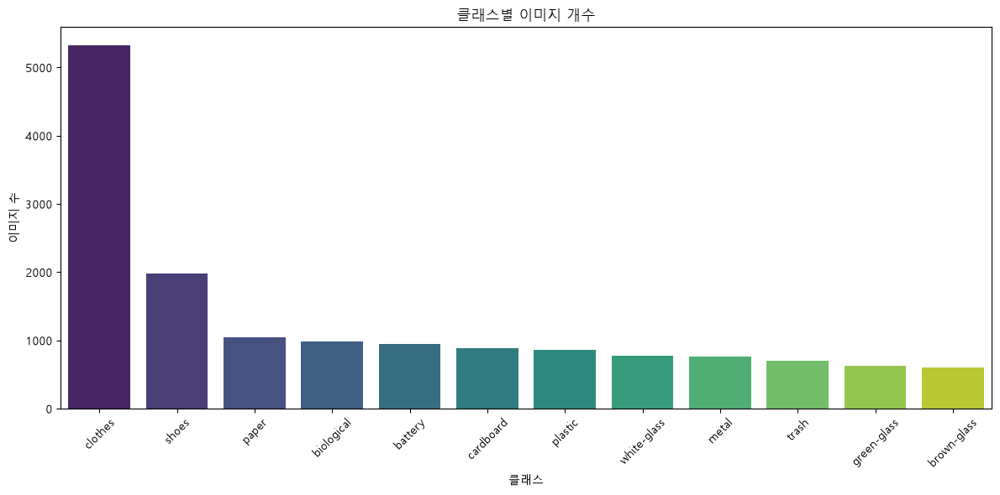

In [5]:
# 4. 클래스 분포 시각화 
plt.figure(figsize=(12, 6))

sns.barplot(
    x=class_counts.index,
    y=class_counts.values,
    hue=class_counts.index,
    palette="viridis",
    legend=False
)

plt.title("클래스별 이미지 개수")
plt.xlabel("클래스")
plt.ylabel("이미지 수")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

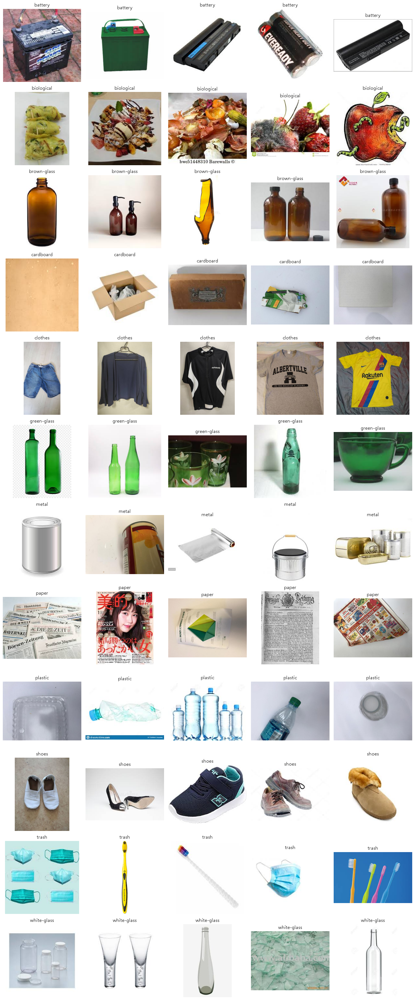

In [6]:
# 5. 클래스별 샘플 이미지 확인
# 각 클래스에서 이미지 5장 무작위 추출해서 표시
classes = sorted(df["class_name"].unique())
samples_per_class = 5

fig, axes = plt.subplots(
    len(classes),
    samples_per_class,
    figsize=(15, 3 * len(classes))
)

for row, class_name in enumerate(classes):
    class_df = df[df["class_name"] == class_name]

    sample_df = class_df.sample(
        n=min(samples_per_class, len(class_df)),
        random_state=42
    )

    for col in range(samples_per_class):
        ax = axes[row, col]
        ax.axis("off")

        if col < len(sample_df):
            image_path = sample_df.iloc[col]["path"]
            image = Image.open(image_path).convert("RGB")

            ax.imshow(image)
            ax.set_title(class_name)

plt.tight_layout()
plt.show()

In [7]:
# 6. 손상된 이미지 검사
valid_records = []
corrupted_records = []

for row in df.itertuples(index=False):
    try:
        with Image.open(row.path) as image:
            image.verify()		# 모든 이미지가 정상으로 열리는지 검사

        valid_records.append(row.path)

    except (UnidentifiedImageError, OSError, ValueError) as error:
        corrupted_records.append({
            "path": row.path,
            "error": str(error)
        })

print("정상 이미지:", len(valid_records))
print("손상 이미지:", len(corrupted_records))

정상 이미지: 15515
손상 이미지: 0


In [8]:
# 7. 이미지 크기와 색상 모드 조사
image_info = []

for row in df.itertuples(index=False):
    try:
        with Image.open(row.path) as image:
            width, height = image.size

            image_info.append({
                "path": row.path,
                "class_name": row.class_name,
                "width": width,
                "height": height,
                "aspect_ratio": width / height,
                "mode": image.mode,
                "file_size_kb": Path(row.path).stat().st_size / 1024
            })

    except (UnidentifiedImageError, OSError):
        pass

image_df = pd.DataFrame(image_info)

display(image_df.head())
display(image_df.describe())

,path,class_name,width,height,aspect_ratio,mode,file_size_kb
0,archive\garbage_classification\battery\battery...,battery,280,180,1.555556,RGB,7.231445
1,archive\garbage_classification\battery\battery...,battery,220,165,1.333333,RGB,4.785156
2,archive\garbage_classification\battery\battery...,battery,275,183,1.502732,RGB,12.671875
3,archive\garbage_classification\battery\battery...,battery,275,183,1.502732,RGB,9.594727
4,archive\garbage_classification\battery\battery...,battery,224,224,1.000000,RGB,3.038086


,width,height,aspect_ratio,file_size_kb
count,15515.000000,15515.000000,15515.000000,15515.000000
mean,349.822301,351.705833,1.084210,15.767770
std,117.548544,149.418487,0.352437,12.094970
min,51.000000,100.000000,0.127500,1.047852
25%,234.000000,224.000000,0.750469,5.804688
50%,400.000000,384.000000,1.000000,12.764648
75%,400.000000,533.000000,1.333333,22.713867
max,888.000000,936.000000,5.020000,85.656250


이미지 크기, 비율이 일정하지 않음 -> 공통크기로 전처리 해야함

In [9]:
# 8. 이미지 색상 모드와 확장자 확인
print("[이미지 색상 모드]")
display(
    image_df["mode"]
    .value_counts()
    .to_frame("count")
)

print("[이미지 확장자]")
display(
    df["extension"]
    .value_counts()
    .to_frame("count")
)

[이미지 색상 모드]


,count
mode,
RGB,15481
P,34


[이미지 확장자]


,count
extension,
.jpg,15515


P는 팔레트 기반 이미지 모드 -> 모델은 일반적으로 RGB 3채널 입력을 사용하므로 Dataset에서 모든 이미지를 다음과 같이 변환

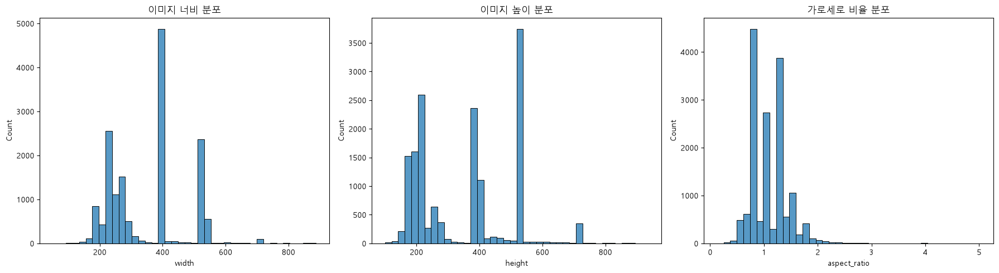

In [10]:
# 9. 이미지 크기 분포 시각화
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.histplot(
    data=image_df,
    x="width",
    bins=40,
    ax=axes[0]
)
axes[0].set_title("이미지 너비 분포")

sns.histplot(
    data=image_df,
    x="height",
    bins=40,
    ax=axes[1]
)
axes[1].set_title("이미지 높이 분포")

sns.histplot(
    data=image_df,
    x="aspect_ratio",
    bins=40,
    ax=axes[2]
)
axes[2].set_title("가로세로 비율 분포")

plt.tight_layout()
plt.show()

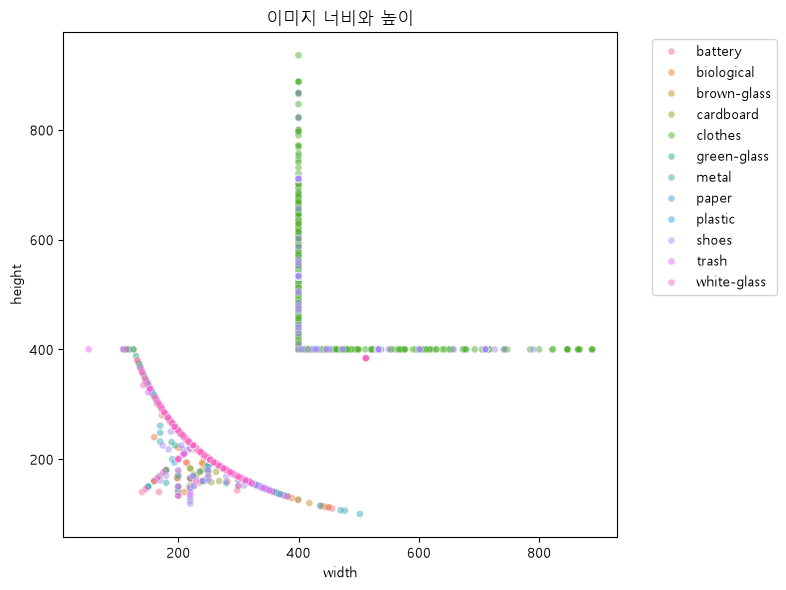

In [11]:
# 10. 너비와 높이의 관계 시각화
plt.figure(figsize=(8, 6))

sns.scatterplot(
    data=image_df,
    x="width",
    y="height",
    hue="class_name",
    alpha=0.5,
    s=25
)

plt.title("이미지 너비와 높이")
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)
plt.tight_layout()
plt.show()

In [12]:
# 11. 극단적으로 작거나 큰 이미지
display(
    image_df.sort_values(
        ["width", "height"]
    ).head(10)
)

display(
    image_df.sort_values(
        ["width", "height"],
        ascending=False
    ).head(10)
)

,path,class_name,width,height,aspect_ratio,mode,file_size_kb
14624,archive\garbage_classification\trash\trash622.jpg,trash,51,400,0.1275,RGB,3.958984
14646,archive\garbage_classification\trash\trash642.jpg,trash,108,400,0.2700,RGB,2.728516
9110,archive\garbage_classification\green-glass\gre...,green-glass,110,400,0.2750,RGB,5.112305
8808,archive\garbage_classification\green-glass\gre...,green-glass,111,400,0.2775,RGB,5.822266
9106,archive\garbage_classification\green-glass\gre...,green-glass,111,400,0.2775,RGB,4.713867
9216,archive\garbage_classification\green-glass\gre...,green-glass,114,400,0.2850,RGB,8.379883
15110,archive\garbage_classification\white-glass\whi...,white-glass,114,400,0.2850,RGB,4.265625
9171,archive\garbage_classification\green-glass\gre...,green-glass,118,400,0.2950,RGB,8.183594
9189,archive\garbage_classification\green-glass\gre...,green-glass,118,400,0.2950,RGB,8.183594
2507,archive\garbage_classification\brown-glass\bro...,brown-glass,125,400,0.3125,RGB,7.798828


,path,class_name,width,height,aspect_ratio,mode,file_size_kb
3749,archive\garbage_classification\clothes\clothes...,clothes,888,400,2.2200,RGB,50.166992
5866,archive\garbage_classification\clothes\clothes...,clothes,888,400,2.2200,RGB,52.147461
7491,archive\garbage_classification\clothes\clothes...,clothes,888,400,2.2200,RGB,70.356445
3603,archive\garbage_classification\clothes\clothes...,clothes,867,400,2.1675,RGB,33.295898
7714,archive\garbage_classification\clothes\clothes...,clothes,867,400,2.1675,RGB,44.967773
7960,archive\garbage_classification\clothes\clothes...,clothes,867,400,2.1675,RGB,31.954102
5589,archive\garbage_classification\clothes\clothes...,clothes,865,400,2.1625,RGB,54.689453
5682,archive\garbage_classification\clothes\clothes...,clothes,865,400,2.1625,RGB,53.684570
6032,archive\garbage_classification\clothes\clothes...,clothes,865,400,2.1625,RGB,46.748047
6336,archive\garbage_classification\clothes\clothes...,clothes,865,400,2.1625,RGB,65.474609


In [13]:
# 12. 극단적인 가로세로 비율 이미지 확인
extreme_df = image_df[
    (image_df["aspect_ratio"] < 0.5) |
    (image_df["aspect_ratio"] > 2.0)
].copy()

print("극단적 가로세로 비율 이미지 수:", len(extreme_df))

display(
    extreme_df["class_name"]
    .value_counts()
    .to_frame("count")
)

극단적 가로세로 비율 이미지 수: 213


,count
class_name,
clothes,32
battery,30
green-glass,27
paper,26
shoes,21
biological,19
trash,15
cardboard,12
white-glass,10


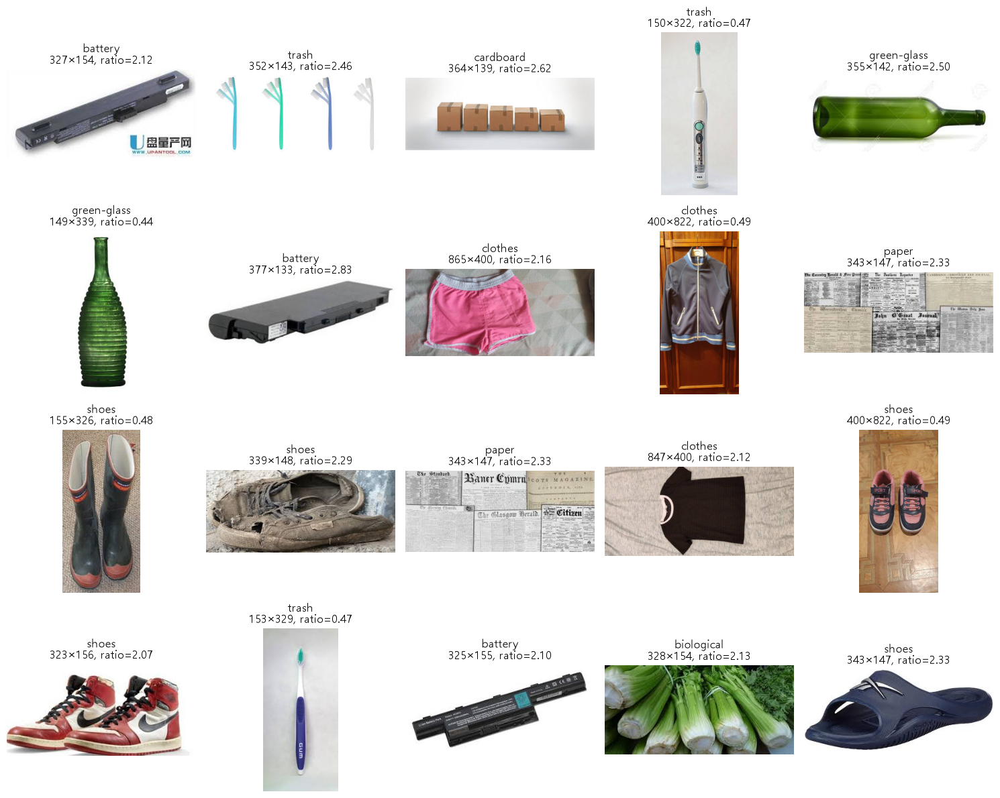

In [14]:
# 13. 극단적인 가로세로 비율 이미지 시각화
# 12에서 찾은 213중 20장 무작위 추출해서 표시
n_samples = min(20, len(extreme_df))

if n_samples > 0:
    sample_extreme = extreme_df.sample(
        n=n_samples,
        random_state=42
    )

    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    axes = axes.flatten()

    for ax in axes:
        ax.axis("off")

    for ax, row in zip(axes, sample_extreme.itertuples()):
        image = Image.open(row.path).convert("RGB")

        ax.imshow(image)
        ax.set_title(
            f"{row.class_name}\n"
            f"{row.width}×{row.height}, "
            f"ratio={row.aspect_ratio:.2f}"
        )

    plt.tight_layout()
    plt.show()
else:
    print("극단적인 비율의 이미지가 없습니다.")

In [15]:
# 14. 클래스별 이미지 크기 비교
size_by_class = (
    image_df
    .groupby("class_name")
    .agg(
        count=("path", "count"),
        width_mean=("width", "mean"),
        width_median=("width", "median"),
        height_mean=("height", "mean"),
        height_median=("height", "median"),
        aspect_ratio_mean=("aspect_ratio", "mean")
    )
    .round(2)
)

display(size_by_class)

,count,width_mean,width_median,height_mean,height_median,aspect_ratio_mean
class_name,,,,,,
battery,945,245.85,225.0,206.79,217.0,1.23
biological,985,262.32,268.0,194.75,187.0,1.39
brown-glass,607,279.47,225.0,256.59,225.0,1.09
cardboard,891,368.19,294.0,285.00,225.0,1.30
clothes,5325,423.00,400.0,516.89,533.0,0.85
green-glass,629,258.21,225.0,251.37,225.0,1.05
metal,769,387.89,512.0,301.18,384.0,1.29
paper,1050,392.56,512.0,313.21,384.0,1.26
plastic,865,390.68,512.0,308.20,384.0,1.26


In [16]:
# 15. 완전히 동일한 이미지 검사
def calculate_md5(file_path, chunk_size=8192):		# 이미지 파일을 일정 크기의 바이트 잔위로 읽어 MD5 해시값을 계산한다
    md5 = hashlib.md5()

    with open(file_path, "rb") as file:
        while chunk := file.read(chunk_size):
            md5.update(chunk)

    return md5.hexdigest()

단, MD5 검사는 다음과 같은 유사 이미지는 찾지 못한다
- 크기만 변경한 이미지
- 약간 잘라낸 이미지
- 밝기만 변경한 이미지
- 다시 압축한 이미지
이런애들은 못찾음

즉, 완전히 동일한 파일만 찾는다

In [17]:
# 16. 완전히 동일한 이미지 탐색
df["md5"] = df["path"].apply(calculate_md5)

duplicate_df = (
    df[df.duplicated("md5", keep=False)]
    .sort_values("md5")
)

print("중복 그룹 수:", duplicate_df["md5"].nunique())
print("중복에 포함된 파일 수:", len(duplicate_df))

display(
    duplicate_df[
        ["class_name", "filename", "path", "md5"]
    ].head(30)
)

중복 그룹 수: 18
중복에 포함된 파일 수: 37


,class_name,filename,path,md5
9300,green-glass,green-glass592.jpg,archive\garbage_classification\green-glass\gre...,1708283500c68dc6f1f23c555c00ee4c
9290,green-glass,green-glass583.jpg,archive\garbage_classification\green-glass\gre...,1708283500c68dc6f1f23c555c00ee4c
9217,green-glass,green-glass517.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9268,green-glass,green-glass563.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9102,green-glass,green-glass413.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9247,green-glass,green-glass544.jpg,archive\garbage_classification\green-glass\gre...,1da311dde8a3756cf210c46c25a3cdef
9166,green-glass,green-glass471.jpg,archive\garbage_classification\green-glass\gre...,1da311dde8a3756cf210c46c25a3cdef
9030,green-glass,green-glass349.jpg,archive\garbage_classification\green-glass\gre...,24afad90a5ac15225840d3bdc818f936
9155,green-glass,green-glass461.jpg,archive\garbage_classification\green-glass\gre...,24afad90a5ac15225840d3bdc818f936
9171,green-glass,green-glass476.jpg,archive\garbage_classification\green-glass\gre...,253e0190dbfb43b44694e4ecfb242812


split 하기전에 중복 제거해야함

In [18]:
# 17. 서로다른 클래스에 포함된 중복 파일
cross_class_duplicates = (
    duplicate_df
    .groupby("md5")
    .filter(lambda group: group["class_name"].nunique() > 1)
)

print(
    "서로 다른 클래스에 포함된 중복 파일 수:",
    len(cross_class_duplicates)
)

display(
    cross_class_duplicates[
        ["class_name", "filename", "path", "md5"]
    ].head(30)
)

서로 다른 클래스에 포함된 중복 파일 수: 6


,class_name,filename,path,md5
9781,metal,metal459.jpg,archive\garbage_classification\metal\metal459.jpg,70df08c3ce6d55e25df4edbbe45e5fe3
15088,white-glass,white-glass412.jpg,archive\garbage_classification\white-glass\whi...,70df08c3ce6d55e25df4edbbe45e5fe3
11708,plastic,plastic556.jpg,archive\garbage_classification\plastic\plastic...,a2236bc6f8eae80bf7d6c5f259df8760
15475,white-glass,white-glass761.jpg,archive\garbage_classification\white-glass\whi...,a2236bc6f8eae80bf7d6c5f259df8760
11267,plastic,plastic159.jpg,archive\garbage_classification\plastic\plastic...,e52ec9a8f6089b5780728b148c9f795e
14773,white-glass,white-glass129.jpg,archive\garbage_classification\white-glass\whi...,e52ec9a8f6089b5780728b148c9f795e


이 상태로 학습하면 동일 이미지에 서로 다른 정답을 가르치게 됨 -> 반드시 정정할것

In [19]:
# 동일 클래스 내부의 중복 이미지
same_class_duplicates = (
    duplicate_df
    .groupby("md5")
    .filter(
        lambda group:
        group["class_name"].nunique() == 1
    )
)

print("동일 클래스 중복 파일 수:", len(same_class_duplicates))
print(
    "동일 클래스 중복 그룹 수:",
    same_class_duplicates["md5"].nunique()
)

display(
    same_class_duplicates[
        ["class_name", "filename", "path", "md5"]
    ].head(30)
)

동일 클래스 중복 파일 수: 31
동일 클래스 중복 그룹 수: 15


,class_name,filename,path,md5
9300,green-glass,green-glass592.jpg,archive\garbage_classification\green-glass\gre...,1708283500c68dc6f1f23c555c00ee4c
9290,green-glass,green-glass583.jpg,archive\garbage_classification\green-glass\gre...,1708283500c68dc6f1f23c555c00ee4c
9217,green-glass,green-glass517.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9268,green-glass,green-glass563.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9102,green-glass,green-glass413.jpg,archive\garbage_classification\green-glass\gre...,1c5dba90efe34ff6b8d32575a9c3763d
9247,green-glass,green-glass544.jpg,archive\garbage_classification\green-glass\gre...,1da311dde8a3756cf210c46c25a3cdef
9166,green-glass,green-glass471.jpg,archive\garbage_classification\green-glass\gre...,1da311dde8a3756cf210c46c25a3cdef
9030,green-glass,green-glass349.jpg,archive\garbage_classification\green-glass\gre...,24afad90a5ac15225840d3bdc818f936
9155,green-glass,green-glass461.jpg,archive\garbage_classification\green-glass\gre...,24afad90a5ac15225840d3bdc818f936
9171,green-glass,green-glass476.jpg,archive\garbage_classification\green-glass\gre...,253e0190dbfb43b44694e4ecfb242812


동일 클래스 중복 그룹 수: 15


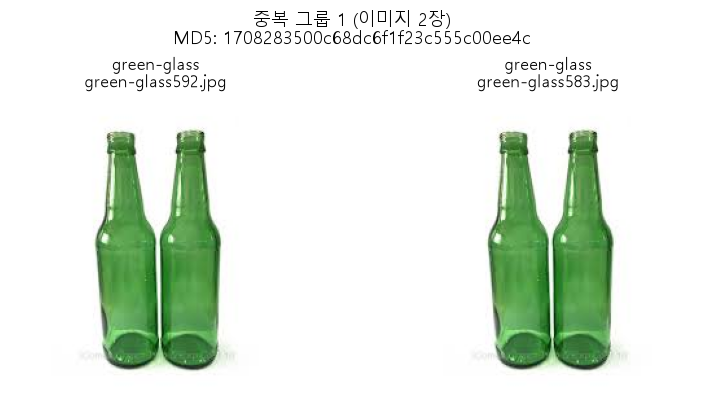

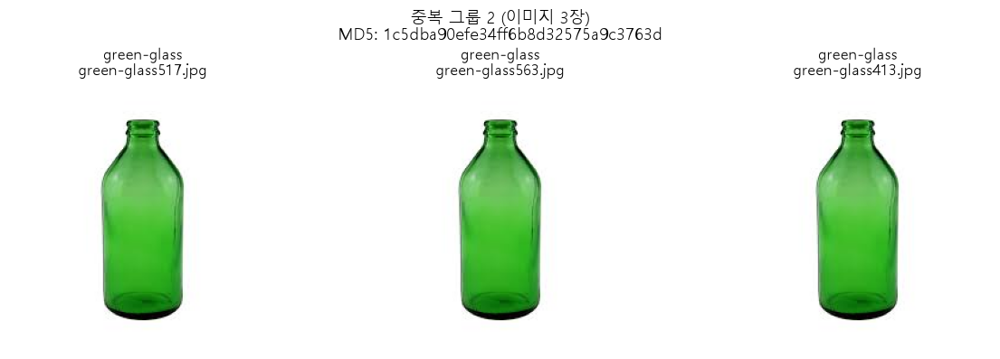

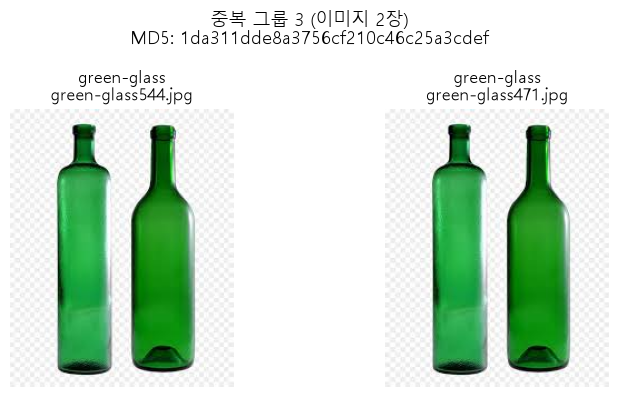

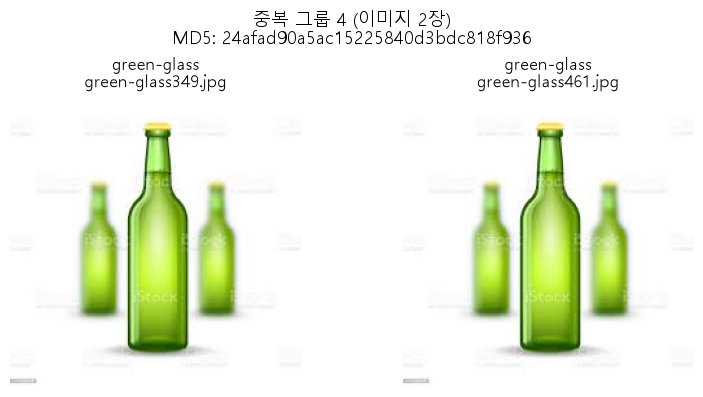

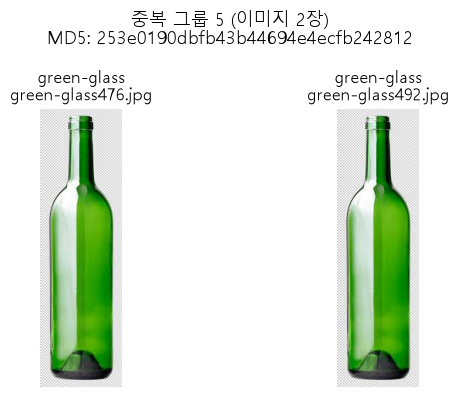

...

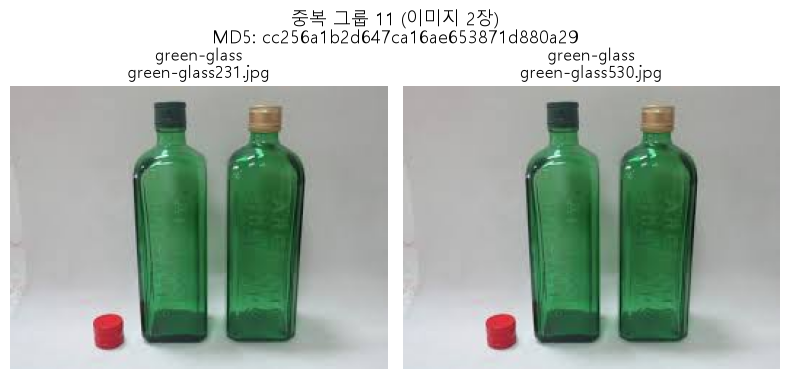

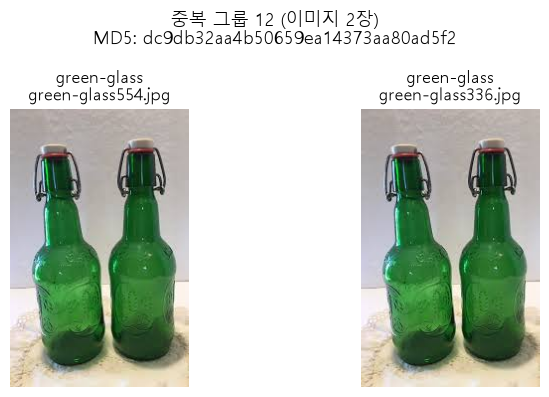

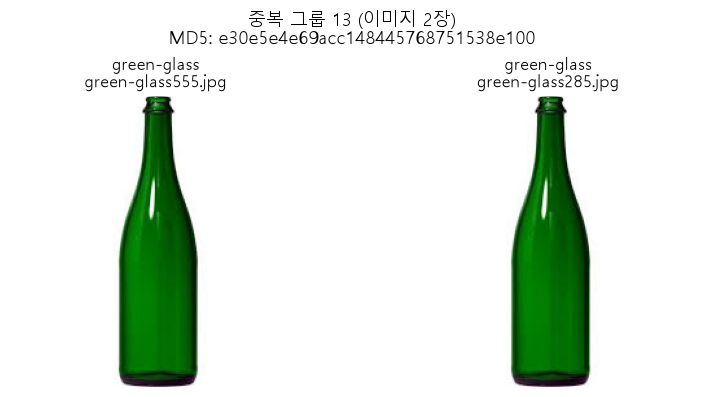

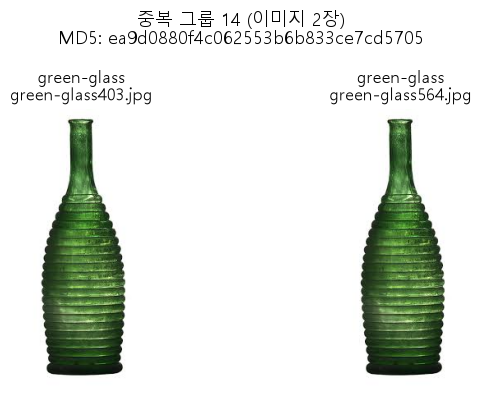

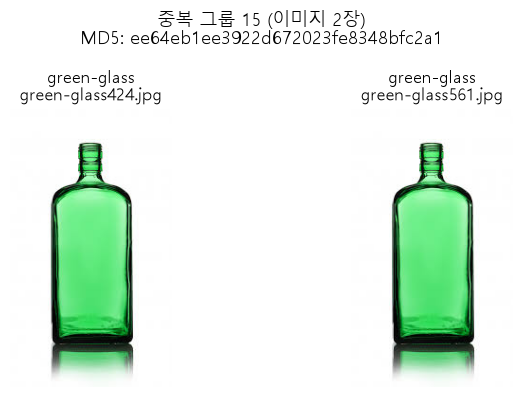

In [20]:
# 18. 동일 클래스 내부 중복 이미지 시각화
same_class_groups = list(
    same_class_duplicates.groupby("md5")
)

print("동일 클래스 중복 그룹 수:", len(same_class_groups))

for group_number, (image_hash, group) in enumerate(
    same_class_groups,
    start=1
):
    group = group.reset_index(drop=True)
    n_images = len(group)

    fig, axes = plt.subplots(
        1,
        n_images,
        figsize=(4 * n_images, 4)
    )

    # 이미지가 1장일 때도 반복 가능한 형태로 변경
    axes = np.atleast_1d(axes)

    for ax, record in zip(axes, group.itertuples()):
        image = Image.open(record.path).convert("RGB")

        ax.imshow(image)
        ax.set_title(
            f"{record.class_name}\n"
            f"{record.filename}"
        )
        ax.axis("off")

    fig.suptitle(
        f"중복 그룹 {group_number} "
        f"(이미지 {n_images}장)\n"
        f"MD5: {image_hash}",
        fontsize=13
    )

    plt.tight_layout()
    plt.show()

얘네는 중복된건 제거하면 됨

In [21]:
# 동일 클래스 중복의 클래스 분포
display(
    same_class_duplicates["class_name"]
    .value_counts()
    .to_frame("duplicate_count")
)

,duplicate_count
class_name,
green-glass,29
clothes,2


대부분 green-glass, 일부 clothes -> 삭제하면 됨

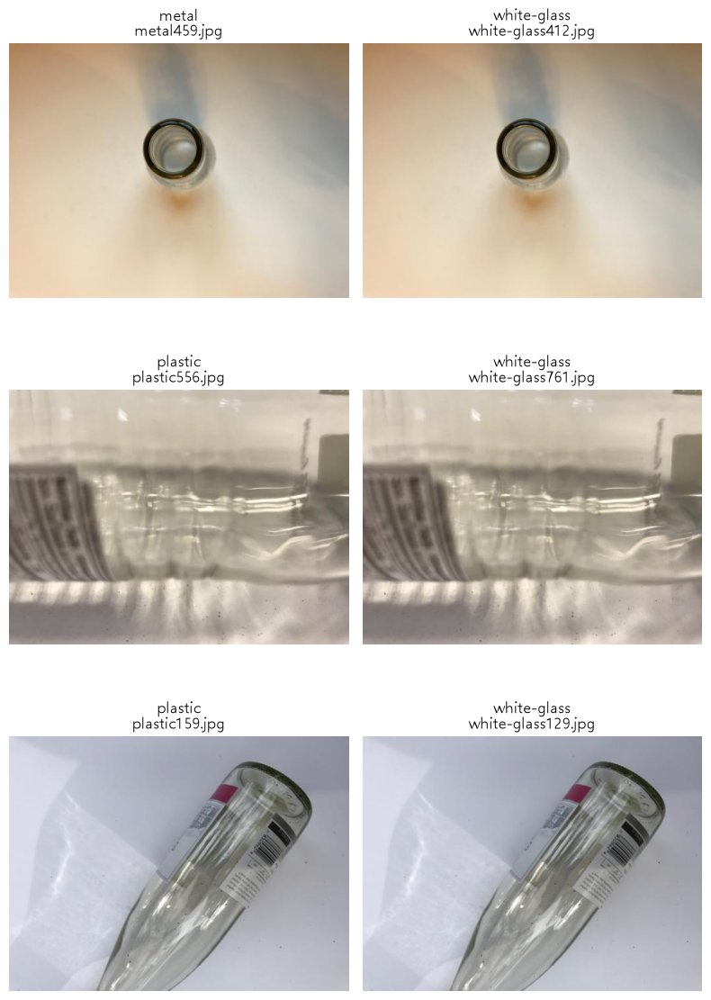

In [22]:
# 21. 서로 다른 클래스에 동일하게 포함된 이미지 시각화
conflict_groups = list(
    cross_class_duplicates.groupby("md5")
)

fig, axes = plt.subplots(
    len(conflict_groups),
    2,
    figsize=(8, 4 * len(conflict_groups))
)

if len(conflict_groups) == 1:
    axes = np.array([axes])

for row_idx, (image_hash, group) in enumerate(conflict_groups):
    group = group.reset_index(drop=True)

    for col_idx, record in group.head(2).iterrows():
        image = Image.open(record["path"]).convert("RGB")

        axes[row_idx, col_idx].imshow(image)
        axes[row_idx, col_idx].set_title(
            f'{record["class_name"]}\n'
            f'{record["filename"]}'
        )
        axes[row_idx, col_idx].axis("off")

plt.tight_layout()
plt.show()

완전히 같은데 class 분류가 다르게 되어있는애들 -> 눈으로 식별해야함

### 근접 중복은 MD5로 잡히지 않는다

앞의 15~21번 셀에서 MD5 해시로 **완전 동일한** 중복을 찾았다. 그런데 MD5는 바이트가 1비트만 달라도 다른 파일로 본다. 같은 사진을 리사이즈하거나 다시 JPEG로 저장하면 해시가 완전히 달라지지만 사람 눈에는 같은 사진이다. 이것이 **근접 중복(near-duplicate)**이고, train/test 데이터 누수의 실제 원인이다.

근접 중복 탐지는 별도 노트북에서 수행했다. 아래 셀의 목록은 그 결과를 가져와 반영한 것이다.

| 목록 | 출처 노트북 | 방법 |
|---|---|---|
| `near_groups_text` | `appendix/A1_duplicate_detection.ipynb` | dHash 16×16 → Hamming ≤ 5 → 픽셀 검증 → Union-Find → 육안 오탐 제외 |
| `label_corrections` | `appendix/A2_label_error_detection.ipynb` | 확신도 0.9 이상 오분류 204건 전수 육안 확인 |
| `quality_exclusions` | 위 육안 검토 과정 | C(애매) / D(비사진) 분류 |

근접 중복 그룹은 **삭제하지 않는다.** 같은 split 안에만 들어가도록 `split_group` 으로 묶어, 같은 사진이 train과 test로 갈라지는 것을 막는다.


In [23]:
# 22. 추가 검수 결과: 라벨 정정, 품질 제외, 근접 중복 그룹 정의
#
# ─────────────────────────────────────────────────────────────────────────────
# [출처] 아래 세 목록은 이 노트북에서 새로 탐지한 것이 아니라,
#        별도 진단 노트북의 결과를 팀 합의안으로 반영한 것이다.
#
#   near_groups_text (근접 중복 그룹)
#     -> appendix/A1_duplicate_detection.ipynb
#        dHash 16x16(256bit) -> Hamming distance <= 5 로 후보 추출
#        -> 32x32 RGB 평균 절대차 < 0.05 로 픽셀 검증
#        -> Union-Find 로 연결된 쌍을 하나의 그룹으로 병합
#        -> 사람이 전수 육안 확인해 오탐 7그룹(서로 다른 칫솔 제품) 제외
#
#   label_corrections (라벨 정정)
#     -> appendix/A2_label_error_detection.ipynb
#        held-out 확신도 0.9 이상 오분류 59건 + train 2-fold OOF 145건
#        = 총 204건을 전수 육안 확인해 확정
#
#   quality_exclusions (애매 / 비사진)
#     -> 위 204건 육안 검토 과정에서 분류된 C(애매) / D(비사진) 항목
#
#   MD5 완전 동일 중복은 이 노트북 15~21번 셀에서 직접 탐지했다.
#   근접 중복은 바이트가 달라 MD5로 잡히지 않으므로 별도 탐지가 필요했다.
#
#   문서: docs/label_error_detection_method.md, docs/data_cleaning_summary.md
# ─────────────────────────────────────────────────────────────────────────────
clothes_to_shoes = """
clothes3062.jpg clothes3330.jpg clothes5002.jpg clothes2197.jpg clothes4465.jpg clothes1229.jpg
clothes2272.jpg clothes791.jpg clothes4836.jpg clothes5277.jpg clothes5181.jpg clothes3623.jpg
clothes3807.jpg clothes451.jpg clothes2162.jpg clothes4329.jpg clothes255.jpg clothes559.jpg
clothes2185.jpg clothes4319.jpg clothes4611.jpg clothes5201.jpg clothes2556.jpg clothes1015.jpg
clothes82.jpg clothes3374.jpg clothes4466.jpg clothes4635.jpg clothes2334.jpg clothes2654.jpg
clothes4150.jpg clothes1312.jpg clothes4293.jpg clothes2733.jpg clothes53.jpg clothes3206.jpg
clothes5045.jpg clothes1444.jpg clothes4495.jpg clothes4469.jpg clothes3895.jpg clothes1582.jpg
clothes3545.jpg clothes526.jpg
""".split()

label_corrections = {name: "shoes" for name in clothes_to_shoes}
label_corrections.update({
    "shoes1826.jpg": "clothes",
    "white-glass704.jpg": "green-glass",
    "paper8.jpg": "plastic",
    "paper9.jpg": "plastic",
})

quality_exclusions = {
    "white-glass58.jpg": "여러 색상의 유리병이 혼재",
    "shoes379.jpg": "하이힐 모양 장식품으로 클래스 경계가 불명확",
    "trash223.jpg": "클립아트 일러스트",
    "plastic605.jpg": "연필 스케치",
    "white-glass112.jpg": "클립아트 일러스트",
    "metal502.jpg": "워터마크가 있는 목업 이미지",
    "green-glass372.jpg": "제품 렌더링·목업 이미지",
}

# 각 줄이 하나의 근접 중복 그룹입니다. 완전 중복 그룹도 검수 기록을 위해 포함합니다.
near_groups_text = """
battery268.jpg,battery343.jpg
battery63.jpg,battery833.jpg
battery759.jpg,battery945.jpg
biological401.jpg,biological709.jpg
biological402.jpg,biological781.jpg
biological410.jpg,biological865.jpg
brown-glass19.jpg,brown-glass439.jpg
clothes2051.jpg,clothes5234.jpg
clothes5095.jpg,clothes536.jpg
green-glass190.jpg,green-glass46.jpg
green-glass2.jpg,green-glass292.jpg,green-glass443.jpg
green-glass228.jpg,green-glass433.jpg
green-glass231.jpg,green-glass530.jpg
green-glass285.jpg,green-glass555.jpg
green-glass336.jpg,green-glass554.jpg
green-glass349.jpg,green-glass461.jpg
green-glass388.jpg,green-glass459.jpg
green-glass403.jpg,green-glass564.jpg
green-glass413.jpg,green-glass517.jpg,green-glass563.jpg
green-glass422.jpg,green-glass482.jpg
green-glass424.jpg,green-glass561.jpg
green-glass449.jpg,green-glass565.jpg
green-glass451.jpg,green-glass488.jpg
green-glass471.jpg,green-glass544.jpg
green-glass476.jpg,green-glass492.jpg
green-glass583.jpg,green-glass592.jpg
metal459.jpg,white-glass412.jpg
metal590.jpg,metal745.jpg
plastic159.jpg,white-glass129.jpg
plastic467.jpg,plastic506.jpg
plastic556.jpg,white-glass761.jpg
shoes1049.jpg,shoes1390.jpg
shoes1065.jpg,shoes1482.jpg,shoes651.jpg
shoes1095.jpg,shoes777.jpg
shoes1128.jpg,shoes615.jpg
shoes1227.jpg,shoes1368.jpg
shoes29.jpg,shoes621.jpg
trash238.jpg,trash301.jpg
trash254.jpg,trash559.jpg
trash683.jpg,trash688.jpg
white-glass300.jpg,white-glass472.jpg
white-glass674.jpg,white-glass688.jpg
paper8.jpg,paper9.jpg
"""
near_duplicate_groups = [line.split(",") for line in near_groups_text.strip().splitlines()]
near_duplicate_map = {}
for group_number, filenames in enumerate(near_duplicate_groups, start=1):
    group_id = f"near_dup_{group_number:03d}"
    for filename in filenames:
        if filename in near_duplicate_map:
            raise ValueError(f"근접 중복 그룹에 중복 등록된 파일: {filename}")
        near_duplicate_map[filename] = group_id

reviewed_files = set(label_corrections) | set(quality_exclusions) | set(near_duplicate_map)
missing_reviewed_files = sorted(reviewed_files - set(df["filename"]))
print("라벨 정정 대상:", len(label_corrections))
print("품질 제외 대상:", len(quality_exclusions))
print("근접 중복 그룹:", len(near_duplicate_groups))
print("목록에서 찾지 못한 파일:", missing_reviewed_files)
if missing_reviewed_files:
    raise FileNotFoundError("검수 목록의 일부 파일이 데이터셋에 없습니다.")

라벨 정정 대상: 48
품질 제외 대상: 7
근접 중복 그룹: 43
목록에서 찾지 못한 파일: []


전구의 밑부분(Base) 또는 유리병 입구로 해석이 엇갈리고, 동일 이미지가 metal과 white-glass에 중복 등록되어 원본 라벨을 신뢰하기 어려움.
서로 다른 클래스에 포함된 완전 동일 이미지에 대한 공통 정제 원칙에 따라 두 파일 모두 모델 데이터에서 제외함.

In [25]:
# 23. 정제 정책 적용 및 변경 이력 생성
audit_df = df.copy()
audit_df["original_class"] = audit_df["class_name"]
audit_df["include_in_model"] = True
audit_df["cleaning_action"] = "keep"
audit_df["cleaning_reason"] = ""
audit_df["near_duplicate_group"] = audit_df["filename"].map(near_duplicate_map)

# 서로 다른 클래스에 들어간 완전 동일 파일은 원본 라벨을 신뢰하기 어려워 모두 제외
cross_class_hashes = set(cross_class_duplicates["md5"])
cross_mask = audit_df["md5"].isin(cross_class_hashes)
audit_df.loc[cross_mask, ["include_in_model", "cleaning_action", "cleaning_reason"]] = [
    False, "exclude", "서로 다른 클래스에 포함된 완전 동일 이미지"
]

# 같은 클래스의 완전 중복은 정렬상 첫 파일만 유지
same_class_hashes = set(same_class_duplicates["md5"])
same_mask = audit_df["md5"].isin(same_class_hashes)
same_duplicate_extra = same_mask & audit_df.duplicated("md5", keep="first")
audit_df.loc[same_duplicate_extra, ["include_in_model", "cleaning_action", "cleaning_reason"]] = [
    False, "exclude", "같은 클래스의 완전 중복 이미지"
]

# 애매한 이미지와 비사진 파일 제외
for filename, reason in quality_exclusions.items():
    mask = audit_df["filename"].eq(filename)
    audit_df.loc[mask, ["include_in_model", "cleaning_action", "cleaning_reason"]] = [
        False, "exclude", reason
    ]

# 명확한 라벨 오류 정정
for filename, corrected_class in label_corrections.items():
    mask = audit_df["filename"].eq(filename) & audit_df["include_in_model"]
    original_values = audit_df.loc[mask, "class_name"].unique()
    if len(original_values) != 1:
        raise ValueError(f"라벨 정정 대상 확인 실패: {filename}")
    audit_df.loc[mask, "class_name"] = corrected_class
    audit_df.loc[mask, "cleaning_action"] = "relabel"
    audit_df.loc[mask, "cleaning_reason"] = (
        audit_df.loc[mask, "original_class"] + " → " + corrected_class
    )

clean_df = audit_df[audit_df["include_in_model"]].copy().reset_index(drop=True)
# 근접 중복이 없는 이미지는 자체 MD5를 분할 그룹으로 사용하여 각각 독립 그룹으로 유지
clean_df["split_group"] = clean_df["near_duplicate_group"].fillna("single_" + clean_df["md5"])

print("정제 전 이미지 수:", len(df))
print("정제 후 이미지 수:", len(clean_df))
print("제외 이미지 수:", (~audit_df["include_in_model"]).sum())
print("라벨 정정 이미지 수:", (audit_df["cleaning_action"] == "relabel").sum())
print("정제 후 완전 중복 해시 수:", clean_df["md5"].duplicated().sum())
print("정제 후 근접 중복 그룹 수:", clean_df["near_duplicate_group"].nunique())
display(audit_df["cleaning_action"].value_counts().to_frame("count"))
display(audit_df.loc[audit_df["cleaning_action"] != "keep", [
    "filename", "original_class", "class_name", "cleaning_action", "cleaning_reason"
]].head(100))

정제 전 이미지 수: 15515
정제 후 이미지 수: 15486
제외 이미지 수: 29
라벨 정정 이미지 수: 48
정제 후 완전 중복 해시 수: 0
정제 후 근접 중복 그룹 수: 40


,count
cleaning_action,
keep,15438
relabel,48
exclude,29


,filename,original_class,class_name,cleaning_action,cleaning_reason
3447,clothes1015.jpg,clothes,shoes,relabel,clothes → shoes
3684,clothes1229.jpg,clothes,shoes,relabel,clothes → shoes
3777,clothes1312.jpg,clothes,shoes,relabel,clothes → shoes
3923,clothes1444.jpg,clothes,shoes,relabel,clothes → shoes
4076,clothes1582.jpg,clothes,shoes,relabel,clothes → shoes
...,...,...,...,...,...
14773,white-glass129.jpg,white-glass,white-glass,exclude,서로 다른 클래스에 포함된 완전 동일 이미지
15088,white-glass412.jpg,white-glass,white-glass,exclude,서로 다른 클래스에 포함된 완전 동일 이미지
15273,white-glass58.jpg,white-glass,white-glass,exclude,여러 색상의 유리병이 혼재
15412,white-glass704.jpg,white-glass,green-glass,relabel,white-glass → green-glass


원본 이미지 파일은 삭제하지 않았으므로 필요하면 정제 판단을 되돌릴 수 있다.

,count,ratio_percent
class_name,,
clothes,5281,34.10
shoes,2019,13.04
paper,1048,6.77
biological,985,6.36
battery,945,6.10
cardboard,891,5.75
plastic,864,5.58
white-glass,769,4.97
metal,767,4.95


최대/최소 클래스 불균형 비율: 8.70배


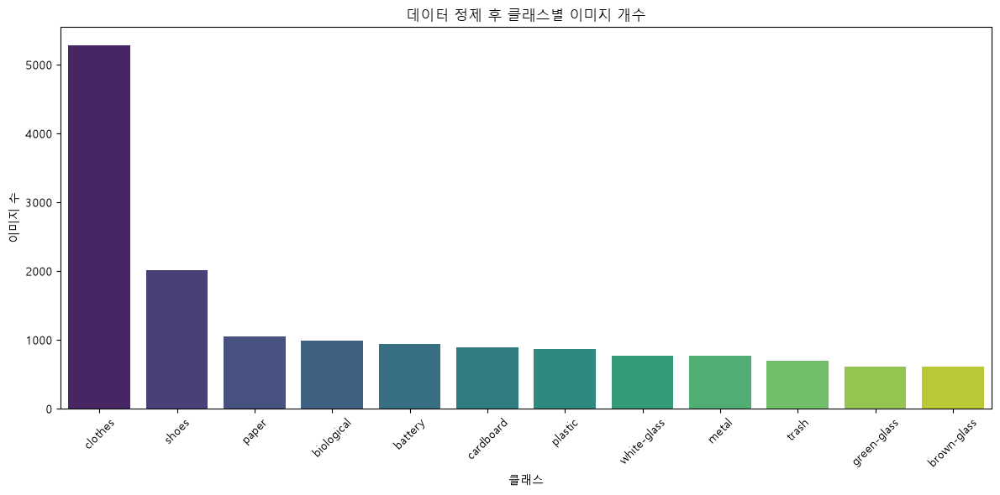

In [26]:
# 24. 정제 후 클래스 분포와 불균형 확인
clean_counts = clean_df["class_name"].value_counts().sort_values(ascending=False)
clean_summary = pd.DataFrame({
    "count": clean_counts,
    "ratio_percent": (clean_counts / len(clean_df) * 100).round(2)
})
display(clean_summary)
print(f"최대/최소 클래스 불균형 비율: {clean_counts.max() / clean_counts.min():.2f}배")

plt.figure(figsize=(12, 6))
sns.barplot(x=clean_counts.index, y=clean_counts.values, hue=clean_counts.index, palette="viridis", legend=False)
plt.title("데이터 정제 후 클래스별 이미지 개수")
plt.xlabel("클래스")
plt.ylabel("이미지 수")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

클래스 간 시각적 유사성 정리
| 비교 대상 | 예상되는 문제 |
|---|---|
| paper ↔ cardboard | 색상과 재질이 유사함 |
| white-glass ↔ plastic | 투명 용기 형태가 유사함 |
| brown-glass ↔ green-glass | 조명에 따라 색 구분이 어려움 |
| clothes ↔ shoes | 배경 또는 소재가 유사할 수 있음 |
| plastic ↔ trash | 일반 쓰레기에 플라스틱이 포함될 수 있음 |
| battery ↔ metal | 금속성 표면이 공통적으로 나타남 |

In [27]:
# 26. EDA 결과 저장

image_columns = [
    "path", "class_name", "width", "height",
    "aspect_ratio", "mode", "file_size_kb"
]

eda_df = clean_df.merge(
    image_df[image_columns],
    on=["path", "class_name"],
    how="left"
)

eda_df.to_csv(
    "garbage_clean_metadata_final.csv",
    index=False,
    encoding="utf-8-sig"
)

audit_df.to_csv(
    "garbage_cleaning_audit.csv",
    index=False,
    encoding="utf-8-sig"
)

print("최종 메타데이터 저장 완료")
print("최종 이미지 수:", len(eda_df))
print("저장 파일: garbage_clean_metadata_final.csv")
print("정제 이력: garbage_cleaning_audit.csv")

display(eda_df.head())

최종 메타데이터 저장 완료
최종 이미지 수: 15486
저장 파일: garbage_clean_metadata_final.csv
정제 이력: garbage_cleaning_audit.csv


,path,filename,class_name,extension,md5,original_class,include_in_model,cleaning_action,cleaning_reason,near_duplicate_group,split_group,width,height,aspect_ratio,mode,file_size_kb
0,archive\garbage_classification\battery\battery...,battery1.jpg,battery,.jpg,f97a23ebb921020ce0dc8c5eb92234d0,battery,True,keep,,NaN,single_f97a23ebb921020ce0dc8c5eb92234d0,280.0,180.0,1.555556,RGB,7.231445
1,archive\garbage_classification\battery\battery...,battery10.jpg,battery,.jpg,9f851944fa3f3b4d4c4fd1ccab8d7045,battery,True,keep,,NaN,single_9f851944fa3f3b4d4c4fd1ccab8d7045,220.0,165.0,1.333333,RGB,4.785156
2,archive\garbage_classification\battery\battery...,battery100.jpg,battery,.jpg,46c1b57f1fa6df6ae0484651358e3c25,battery,True,keep,,NaN,single_46c1b57f1fa6df6ae0484651358e3c25,275.0,183.0,1.502732,RGB,12.671875
3,archive\garbage_classification\battery\battery...,battery101.jpg,battery,.jpg,e0e7a6d10f02ed74f41f156631c61a33,battery,True,keep,,NaN,single_e0e7a6d10f02ed74f41f156631c61a33,275.0,183.0,1.502732,RGB,9.594727
4,archive\garbage_classification\battery\battery...,battery102.jpg,battery,.jpg,9bab566b0bd52315838818f03e190976,battery,True,keep,,NaN,single_9bab566b0bd52315838818f03e190976,224.0,224.0,1.000000,RGB,3.038086


이미지 정제 정리

1. 이미지 형식 : P 기반의 이미지를 RGB로 변환
2. 이미지 크기 : 이미지 크기가 통일이 안돼있음
3. 완전 중복 이미지 + 같은 클래스 -> 하나씩만 남기고 제외
4. 완전 중복 이미지 + 다른 클래스 -> 모두 제외
5. 근접 중복 이미지 : 일단 보존하되, train과 test에 나뉘어 들억지 않도록 공통 그룹 ID 부여(near_dup_001, 002, ...)
6. 라벨 오류 정정 : clothes -> shoes, shoes -> clothes, white-glass -> green-glass, paper -> plastic
7. 애매한 이미지는 아예 제외 
ex) 유리병이 여러개 섞여있음, 신발 모양 장식품
8. 비사진 이미지는 제외